In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Mounting Google drive to load the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
file_path = '/content/drive/My Drive/Datasets/PJMW_hourly.csv'
df = pd.read_csv(file_path)

In [ ]:
#General info and head of the data set
df.info(),df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143206 entries, 0 to 143205
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  143206 non-null  object 
 1   PJMW_MW   143206 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


(None,
               Datetime  PJMW_MW
 0  2002-12-31 01:00:00   5077.0
 1  2002-12-31 02:00:00   4939.0
 2  2002-12-31 03:00:00   4885.0
 3  2002-12-31 04:00:00   4857.0
 4  2002-12-31 05:00:00   4930.0)

## **Data Cleaning**

In [ ]:
# Convert 'Datetime' to datetime format
# Check if 'Datetime' column exists, if not, assume 'date&time' is the index and reset it
if 'Datetime' not in df.columns and 'date&time' in df.index.name:
    df = df.reset_index()

# Now 'Datetime' should be a column if it was originally, or 'date&time' if it was the index name
# We need to ensure we are working with the correct column name before converting to datetime
datetime_col_name = None
if 'Datetime' in df.columns:
    datetime_col_name = 'Datetime'
elif 'date&time' in df.columns:
    datetime_col_name = 'date&time'

if datetime_col_name:
    df[datetime_col_name] = pd.to_datetime(df[datetime_col_name])

    # Rename the datetime column to date&time if it's not already
    if datetime_col_name != 'date&time':
        df = df.rename(columns={datetime_col_name:'date&time'})

    # Setting data as index
    df.set_index('date&time', inplace=True)

    # sorting the date column
    df.sort_index(inplace=True)

    # Resample to a strict hourly frequency to handle potential gaps or irregularities
    # Use .mean() to aggregate if there are multiple values per hour after handling duplicates
    df = df.resample('H').mean()

    # Changing PJMW_MW Datatype to int from float
    # Need to handle potential NaNs introduced by resampling before converting to int
    df['PJMW_MW'] = df['PJMW_MW'].fillna(method='ffill') # Fill NaN values, forward fill is a common strategy
    df['PJMW_MW'] = df['PJMW_MW'].astype(int)

    # Now the index should have a frequency of 'H'
    print("Frequency after resampling:", df.index.freq)
else:
    print("Error: Neither 'Datetime' nor 'date&time' column found in the DataFrame.")

Frequency after resampling: <Hour>


In [ ]:
#Check for duplicated index values
duplicate_indexes = df.index.duplicated().sum()

print(f"Number of duplicate index values: {duplicate_indexes}")

#Get the duplicate index values
duplicate_index_values = df.index[df.index.duplicated()]

print("Duplicate index values:",duplicate_index_values)

#Dropping duplicate indices in the dataset
df = df[~df.index.duplicated(keep='first')]

duplicate_indexes = df.index.duplicated().sum()

print(f"Number of duplicate index values: {duplicate_indexes}")

Number of duplicate index values: 0
Duplicate index values: DatetimeIndex([], dtype='datetime64[ns]', name='date&time', freq='h')
Number of duplicate index values: 0


In [ ]:
#Creating another dataframe for visualization and future analysis
vdf = df.copy()

# Extract features for analysis
vdf['hour'] = vdf.index.hour
vdf['dayofweek'] = vdf.index.dayofweek
vdf['month'] = vdf.index.month
vdf['year'] = vdf.index.year
vdf['date'] = vdf.index.date

In [ ]:
#GEtting holidays from holidays library and generating those which aren't present in library
from holidays import UnitedStates
import datetime
from dateutil.easter import easter
import calendar
import pandas as pd # Ensure pandas is imported if not already

#Define the range of years you want to cover
years = range(2002, 2019)

#Built-in US holidays
us_holidays = UnitedStates(years=years)

#Making a custom holiday list
holiday_names = [
    "Christmas Day", "Thanksgiving", "Halloween", "Easter", "Mother's Day",
    "New Year's Day", "New Year's Eve", "Independence Day", "Valentine's Day",
    "Father's Day", "Memorial Day", "Veterans Day", "Super Bowl Sunday",
    "Labor Day", "Martin Luther King Jr. Day", "Election Day", "Earth Day",
    "Juneteenth", "St. Patrick's Day", "Columbus Day", "Presidents Day"
]

#Some helper functions for holidays not in `holidays` library
def get_halloween(year):
    return datetime.date(year, 10, 31)

def get_valentines_day(year):
    return datetime.date(year, 2, 14)

def get_mothers_day(year): #2nd Sunday in May
    d = datetime.date(year, 5, 1)
    return d + datetime.timedelta(days=(6 - d.weekday() + 7) % 7)

def get_fathers_day(year): #3rd Sunday in June
    d = datetime.date(year, 6, 1)
    return d + datetime.timedelta(days=(6 - d.weekday() + 14) % 7)

def get_earth_day(year):
    return datetime.date(year, 4, 22)

def get_super_bowl(year): #First Sunday in February (usually)
    feb = datetime.date(year, 2, 1)
    return feb + datetime.timedelta(days=(6 - feb.weekday()) % 7)

#Assembling holiday list
holiday_list = []

for year in years:
    for name in holiday_names:
        # Add built-in holidays
        date = None
        for h_date, h_name in us_holidays.items():
            if h_name == name and h_date.year == year:
                date = h_date
                break

        #Manually assigning if not found
        if not date:
            if name == "Halloween":
                date = get_halloween(year)
            elif name == "Valentine's Day":
                date = get_valentines_day(year)
            elif name == "Easter":
                date = easter(year)
            elif name == "Mother's Day":
                date = get_mothers_day(year)
            elif name == "Father's Day":
                date = get_fathers_day(year)
            elif name == "Earth Day":
                date = get_earth_day(year)
            elif name == "Super Bowl Sunday":
                date = get_super_bowl(year)

        if date:
            holiday_list.append({"Holiday": name, "Date": date})

#Create DataFrame for holiday visualization
holiday_df = pd.DataFrame(holiday_list)
holiday_df.sort_values("Date", inplace=True)
holiday_df.reset_index(drop=True, inplace=True)

# Ensure the 'Date' column in holiday_df is in date format
holiday_df['Date'] = pd.to_datetime(holiday_df['Date']).dt.date

# Create a mapping from date (as date objects) to holiday name from holiday_df
holiday_mapping = holiday_df.set_index('Date')['Holiday']


# Map the holiday names using the date_only column
vdf['Avg/Holiday_Type'] = vdf['date'].map(holiday_mapping)

# Drop the temporary date column
vdf.drop('date', axis=1, inplace=True)

#Fill the missing values (non-holidays) with 'avg_day'
vdf['Avg/Holiday_Type'].fillna('avg_day', inplace=True)

# Display the first few rows and check a holiday date to verify the new column
display(vdf.head())
# Let's check a known holiday date, e.g., Christmas Day 2015, to verify
christmas_2015_data = vdf[vdf.index.date == pd.to_datetime('2015-12-25').date()]
print("\nData for Christmas Day 2015:")
display(christmas_2015_data.head())

,PJMW_MW,hour,dayofweek,month,year,Avg/Holiday_Type
date&time,,,,,,
2002-04-01 01:00:00,4374,1,0,4,2002,avg_day
2002-04-01 02:00:00,4306,2,0,4,2002,avg_day
2002-04-01 03:00:00,4322,3,0,4,2002,avg_day
2002-04-01 04:00:00,4359,4,0,4,2002,avg_day
2002-04-01 05:00:00,4436,5,0,4,2002,avg_day



Data for Christmas Day 2015:


,PJMW_MW,hour,dayofweek,month,year,Avg/Holiday_Type
date&time,,,,,,
2015-12-25 00:00:00,4207,0,4,12,2015,Christmas Day
2015-12-25 01:00:00,3986,1,4,12,2015,Christmas Day
2015-12-25 02:00:00,3808,2,4,12,2015,Christmas Day
2015-12-25 03:00:00,3717,3,4,12,2015,Christmas Day
2015-12-25 04:00:00,3670,4,4,12,2015,Christmas Day


In [ ]:
unique_values_count = vdf['Avg/Holiday_Type'].value_counts()
print("Unique values and their counts in 'Avg/Holiday_Type' column:")
unique_values_count

Unique values and their counts in 'Avg/Holiday_Type' column:


,count
Avg/Holiday_Type,
avg_day,137352
Earth Day,408
Mother's Day,408
Memorial Day,408
Father's Day,408
Independence Day,408
Labor Day,384
Columbus Day,384
Halloween,384


In [ ]:
#Extracting season column from index to visualize Seasonal trends
#defining a function to sort seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

#Extract season and year
vdf['Season'] = vdf['month'].apply(get_season)

#Group by Season and Year
seasonal_summary = vdf.groupby(['year', 'Season'])['PJMW_MW'].sum().reset_index()

#Pivot for plotting
seasonal_pivot = seasonal_summary.pivot(index='year', columns='Season', values='PJMW_MW')

## **Exploratory Data Analysis**

### **Statistical Summary**

In [ ]:
#Statistical Summary table
basic_stats = df.describe(include='all')
skewness = df.skew(numeric_only=True)
kurtosis = df.kurtosis(numeric_only=True)

missing_values = df.isnull().sum()

Dist_stats =pd.DataFrame({'Skewness': skewness, 'Kurtosis': kurtosis, 'Missing Values': missing_values}).T

stats_table =pd.concat([basic_stats, Dist_stats], axis=0)
stats_table

,PJMW_MW
count,143232.000000
mean,5602.227728
std,979.166082
min,487.000000
25%,4906.000000
50%,5530.000000
75%,6252.000000
max,9594.000000
Skewness,0.334938
Kurtosis,-0.221535


### **Data Visualization**

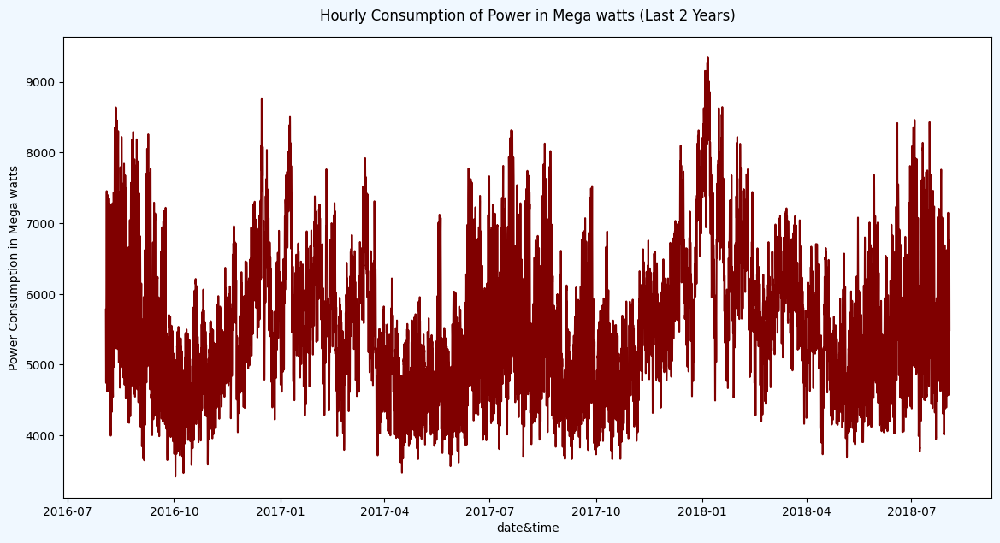

In [ ]:
#Understanding trends and seasonality in the last two years by visualizing the plot of time series
plt.figure(figsize= (14,7),facecolor= 'aliceblue')
#Filter data for the last two years
last_two_years = df[df.index >= (df.index.max() - pd.DateOffset(years=2))]

plt.plot(last_two_years,color = 'maroon')
plt.title("Hourly Consumption of Power in Mega watts (Last 2 Years)",y=1.02)
plt.xlabel('date&time')
plt.ylabel('Power Consumption in Mega watts')
plt.show()

In [ ]:
#Calculate Rolling mean and std dev for 30 day window (already calculated in previous step)
rolling_mean = df['PJMW_MW'].rolling(window=30*24).mean() # 30 days * 24 hours = 720 hours
rolling_std = df['PJMW_MW'].rolling(window=30*24).std()

#Creating an interactive plot using Plotly
fig = go.Figure()

#Adding the original data trace
fig.add_trace(go.Scattergl(x=df.index, y=df['PJMW_MW'],
                           mode='lines',
                           name='Original Data',
                           opacity=0.5))

#Adding the rolling mean trace
fig.add_trace(go.Scattergl(x=rolling_mean.index, y=rolling_mean.values,
                           mode='lines',
                           name='30-Day Rolling Mean',
                           line=dict(color='red')))

#Adding the rolling standard deviation trace
fig.add_trace(go.Scattergl(x=rolling_std.index, y=rolling_std.values,
                           mode='lines',
                           name='30-Day Rolling Std Dev',
                           line=dict(color='green')))

#Update layout for better appearance
fig.update_layout(
    title="Interactive Rolling Mean and Standard Deviation for PJMW_MW (30-Day Window)",
    xaxis_title="Date & Time",
    yaxis_title="PJMW_MW",
    hovermode='x unified' # Show hover information for all traces at a specific x-value
)

fig.show()

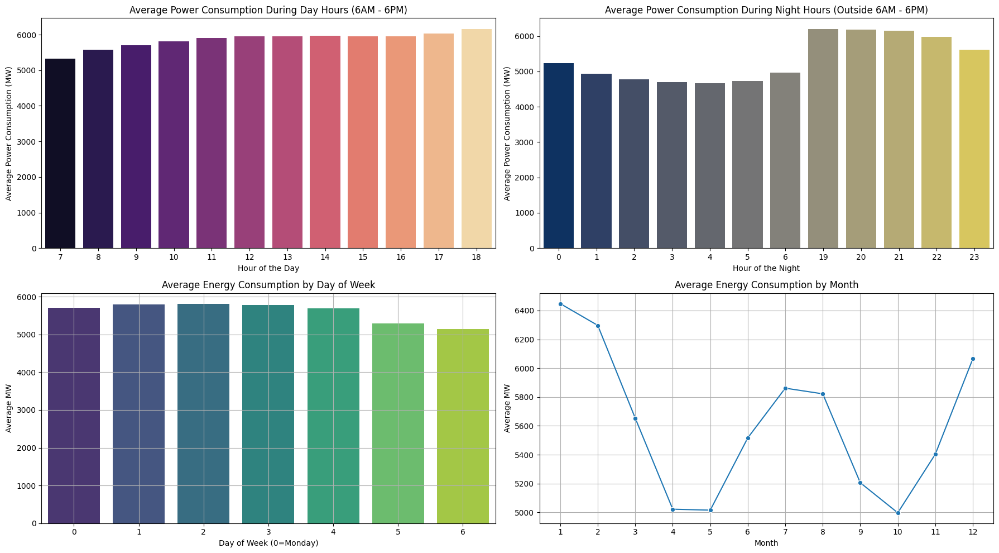

In [ ]:
#Visualizing Avg Power consumption in a day
#Calculate the average power consumption for all hours
average_consumption_per_hour = vdf.groupby('hour')['PJMW_MW'].mean()

#Calculate the average power consumption for day hours
day_hours_df = vdf[(vdf['hour'] >= 7) & (vdf['hour'] <= 18)] # Adjusted to 6 AM - 6 PM
average_consumption_day_hours = day_hours_df.groupby('hour')['PJMW_MW'].mean()

#Calculate the average power consumption for night hours
night_hours_df = vdf[(vdf['hour'] < 7) | (vdf['hour'] > 18)] # Adjusted to outside 6 AM - 6 PM
average_consumption_night_hours = night_hours_df.groupby('hour')['PJMW_MW'].mean()

#Create a figure and use subplot2grid for the desired layout
fig = plt.figure(figsize=(18, 10)) # Adjusted figure size for better readability

#Average Power Consumption During Day Hours (6AM - 6PM) (bottom-left)
ax1 = plt.subplot2grid((2, 2), (0, 0))
sns.barplot(x=average_consumption_day_hours.index, y=average_consumption_day_hours.values, palette='magma', ax=ax1)
ax1.set_title('Average Power Consumption During Day Hours (6AM - 6PM)')
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Average Power Consumption (MW)')
ax1.tick_params(axis='x', rotation=0)

#Average Power Consumption During Night Hours  (top-right)
ax2 = plt.subplot2grid((2, 2), (0, 1))
sns.barplot(x=average_consumption_night_hours.index, y=average_consumption_night_hours.values, palette='cividis', ax=ax2)
ax2.set_title('Average Power Consumption During Night Hours (Outside 6AM - 6PM)')
ax2.set_xlabel('Hour of the Night')
ax2.set_ylabel('Average Power Consumption (MW)')
ax2.tick_params(axis='x', rotation=0)


# Average energy usage by day of the week (top-left)
ax3 = plt.subplot2grid((2, 2), (1, 0))
weekday_avg = vdf.groupby('dayofweek')['PJMW_MW'].mean()
sns.barplot(x=weekday_avg.index, y=weekday_avg.values, palette="viridis", ax=ax3)
ax3.set_title('Average Energy Consumption by Day of Week')
ax3.set_xlabel('Day of Week (0=Monday)')
ax3.set_ylabel('Average MW')
ax3.grid(True)

#Plotting monthly trends (bottom-right)
ax4 = plt.subplot2grid((2, 2), (1, 1))
monthly_avg = vdf.groupby('month')['PJMW_MW'].mean()
sns.lineplot(x=monthly_avg.index, y=monthly_avg.values, marker='o', ax=ax4)
ax4.set_title('Average Energy Consumption by Month')
ax4.set_xlabel('Month')
ax4.set_ylabel('Average MW')
ax4.grid(True)
ax4.set_xticks(range(1, 13)) # Ensure all months are shown


plt.tight_layout() # Adjust layout to prevent titles/labels overlapping
plt.show()

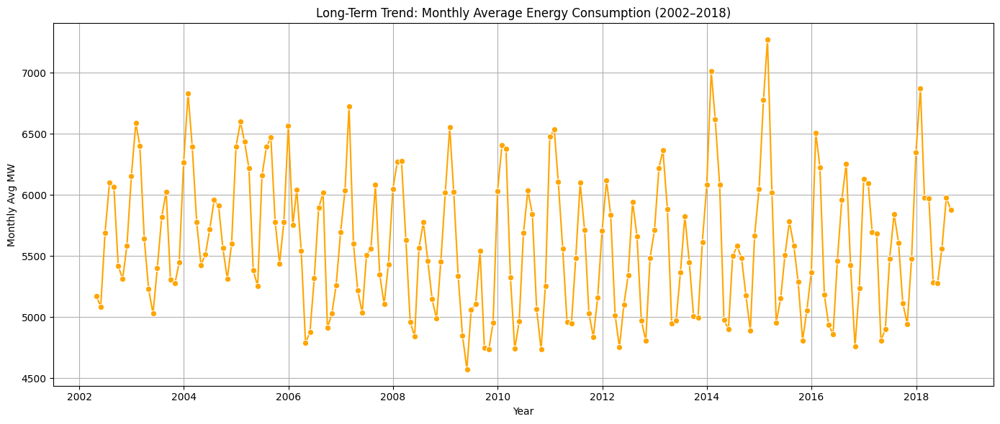

In [ ]:
#Resample to monthly averages for clearer long-term trend visualization
monthly_avg = vdf['PJMW_MW'].resample('M').mean()

#Plot long-term monthly average energy consumption
plt.figure(figsize=(14, 6))
sns.lineplot(x=monthly_avg.index, y=monthly_avg.values, color = 'orange',marker = 'o')
plt.title('Long-Term Trend: Monthly Average Energy Consumption (2002–2018)')
plt.xlabel('Year')
plt.ylabel('Monthly Avg MW')
plt.grid(True)
plt.tight_layout()
plt.show()

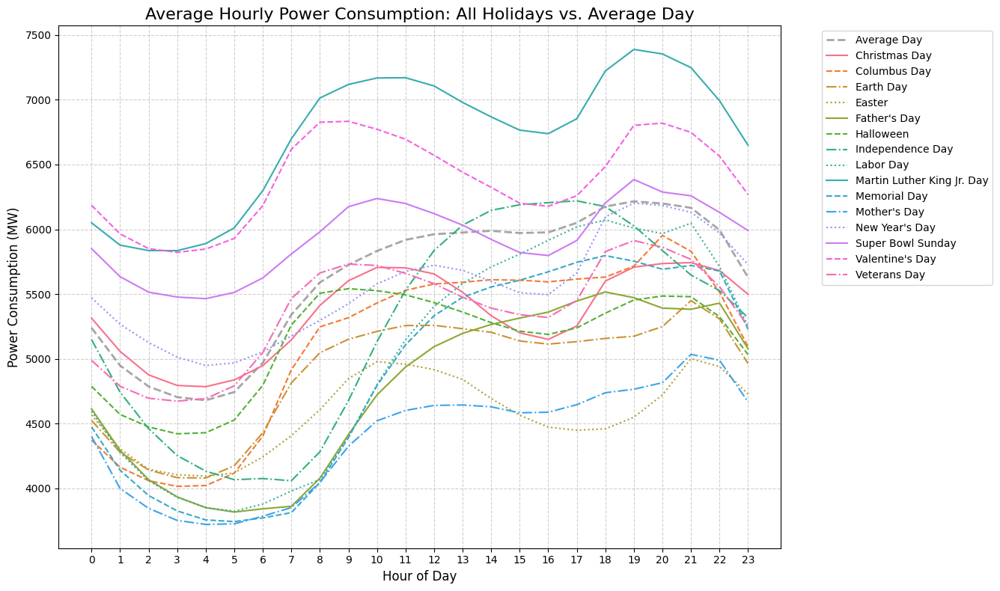

In [ ]:
#Visualizing hourly avg power consumption
#Group by Hour and Holiday Type for all unique holiday types (including avg_day)
hourly_mean_all = vdf.groupby(['hour', 'Avg/Holiday_Type'])['PJMW_MW'].mean().unstack()

#Plotting
plt.figure(figsize=(16, 8)) # Slightly larger figure for better readability

# Plot the average day as a baseline
if 'avg_day' in hourly_mean_all.columns:
    plt.plot(hourly_mean_all.index, hourly_mean_all['avg_day'], label='Average Day', color='gray', linestyle='--', linewidth=2, alpha=0.7) # Added alpha

# Get a list of all holidays to plot (excluding avg_day)
holidays_to_plot = [col for col in hourly_mean_all.columns if col != 'avg_day']

# Define a color palette and line styles
colors = sns.color_palette('husl', n_colors=len(holidays_to_plot)) # Use a distinct color palette
line_styles = ['-', '--', '-.', ':'] # Define a few line styles

# Plot each individual holiday with different colors and line styles
for i, col in enumerate(holidays_to_plot):
    plt.plot(hourly_mean_all.index, hourly_mean_all[col], label=col, color=colors[i % len(colors)], linestyle=line_styles[i % len(line_styles)], linewidth=1.5)


plt.title('Average Hourly Power Consumption: All Holidays vs. Average Day', fontsize=16)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Power Consumption (MW)', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10) # Place legend outside the plot
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(range(00, 24, 1)) # Ensure all hours are shown on x-axis
plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make room for the legend
plt.show()

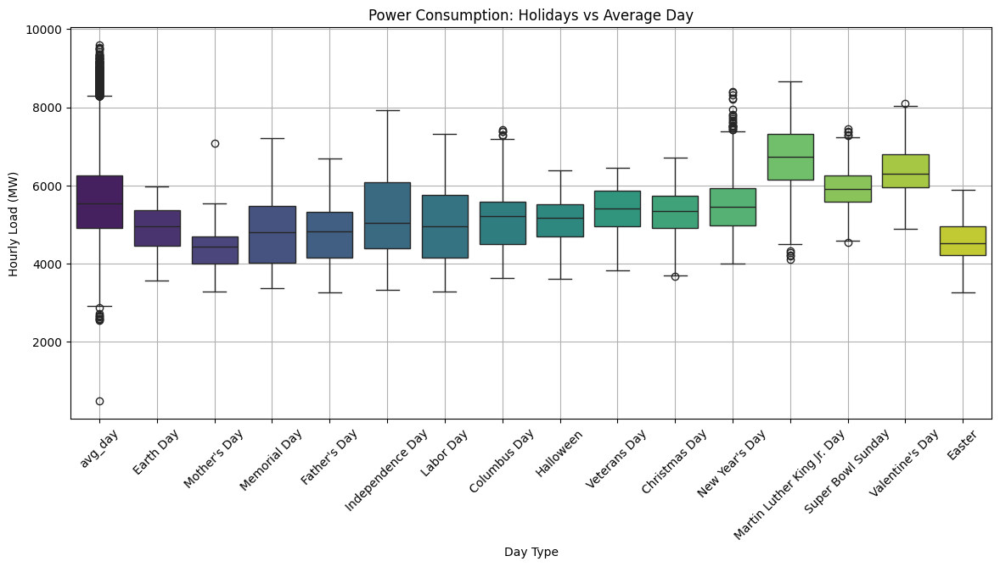

In [ ]:
#Bxploting power consumption of avg_day vs holidays
plt.figure(figsize=(14, 6))
sns.boxplot(data=vdf, x='Avg/Holiday_Type', y='PJMW_MW', palette='viridis') # Changed palette to 'viridis'
plt.title('Power Consumption: Holidays vs Average Day')
plt.ylabel('Hourly Load (MW)')
plt.xlabel('Day Type')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

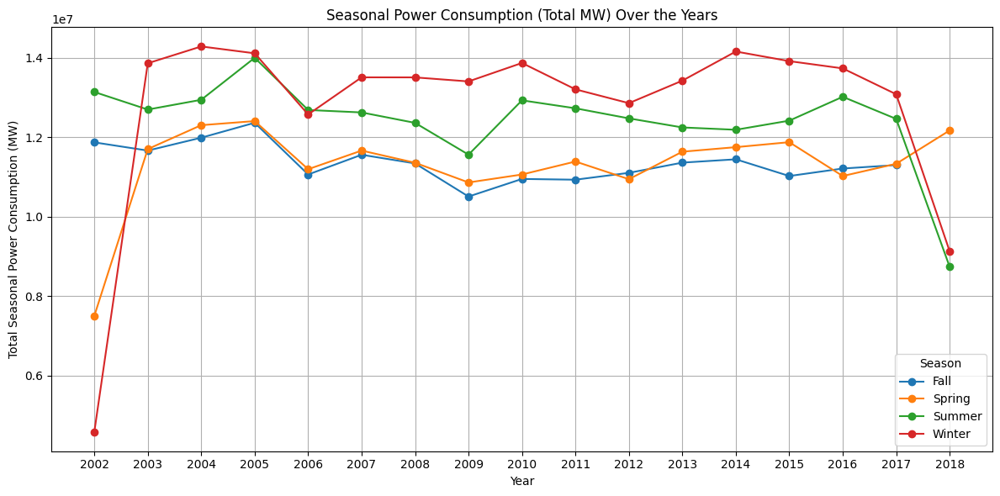

In [ ]:
#Visualizing Seasonal trends
seasonal_pivot.plot(figsize=(12, 6), marker='o')
plt.title('Seasonal Power Consumption (Total MW) Over the Years')
plt.ylabel('Total Seasonal Power Consumption (MW)')
plt.xlabel('Year')
plt.grid(True)
plt.xticks(seasonal_pivot.index)
plt.legend(title='Season')
plt.tight_layout()
plt.show()

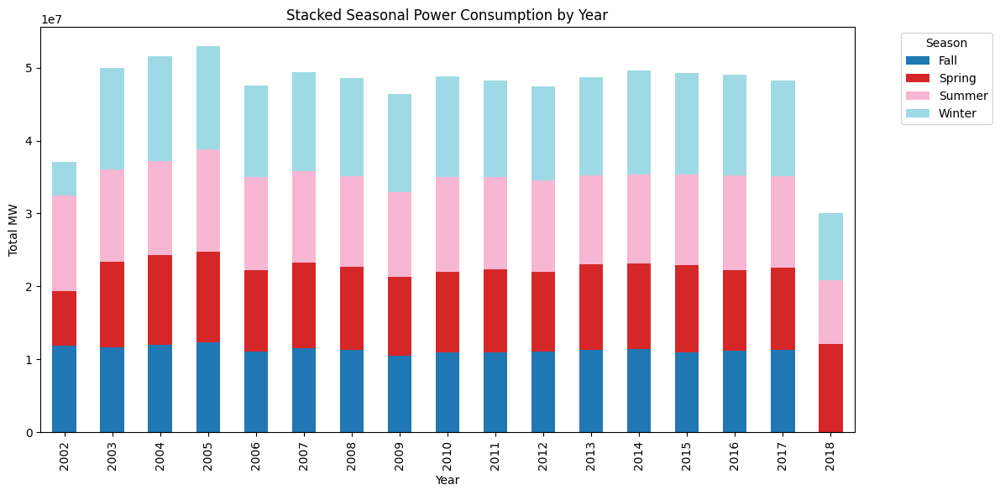

In [ ]:
seasonal_pivot.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title('Stacked Seasonal Power Consumption by Year')
plt.ylabel('Total MW')
plt.xlabel('Year')
plt.legend(title='Season', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

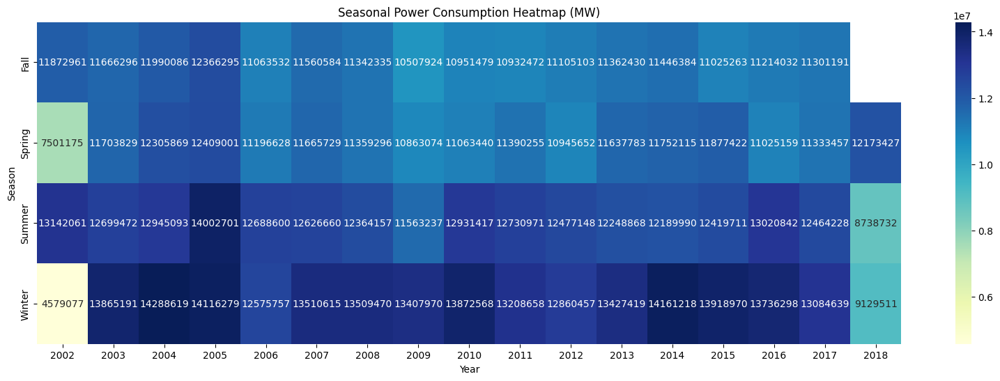

In [ ]:
#Seasonal Power consumption heatmap
plt.figure(figsize=(20, 6))
sns.heatmap(seasonal_pivot.T, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title('Seasonal Power Consumption Heatmap (MW)')
plt.ylabel('Season')
plt.xlabel('Year')
plt.show()

## **Model Building**

In [ ]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller test
adf_test = adfuller(df['PJMW_MW'])

# Extract test results
adf_statistic = adf_test[0]
p_value = adf_test[1]
critical_values = adf_test[4]

print(f"ADF Statistic: {adf_statistic}")
print(f"P-value: {p_value}")
print("Critical Values:")
for key, value in critical_values.items():
    print(f"  {key}: {value}")

# Interpret the results
alpha = 0.05
if p_value <= alpha:
    print(f"\nConclusion: The p-value ({p_value:.4f}) is less than or equal to the significance level ({alpha}).")
    print("We reject the null hypothesis. The time series is likely stationary.")
else:
    print(f"\nConclusion: The p-value ({p_value:.4f}) is greater than the significance level ({alpha}).")
    print("We fail to reject the null hypothesis. The time series is likely non-stationary.")

ADF Statistic: -19.934313560121172
P-value: 0.0
Critical Values:
  1%: -3.4303956800384174
  5%: -2.861560189928386
  10%: -2.5667807463806995

Conclusion: The p-value (0.0000) is less than or equal to the significance level (0.05).
We reject the null hypothesis. The time series is likely stationary.


In [ ]:
from re import X
#Splitting dataset
from sklearn.model_selection import train_test_split # Keep import for potential future use, but not for time series split here
from sklearn.preprocessing import StandardScaler
import logging
logging.getLogger("NP.plotly").setLevel(logging.CRITICAL)

#taking sample from
df = df[df.index >= df.index.max() - pd.DateOffset(years=4)]

target_col = 'PJMW_MW'

# Use the original df directly for time series splitting
y = df[[target_col]]

# Define the number of hours for the test set (last 365 days)
test_days = 365 * 24

# Perform a time-based split
y_train = y.iloc[:-test_days]
y_test = y.iloc[-test_days:]


print(f"Shape of training data (y_train): {y_train.shape}")
print(f"Shape of test data (y_test): {y_test.shape}")

Shape of training data (y_train): (26305, 1)
Shape of test data (y_test): (8760, 1)


In [ ]:
# ___ SARIMAX Model ___
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Droping missing values from y_train
y_train_clean = y_train.dropna()

# Pre-fill forecast
sarima_forecast = pd.Series([np.nan] * len(y_test), index=y_test.index)

# Proceed if sufficient data
if len(y_train_clean) > 48:
    try:
        sarima_model = SARIMAX(
            y_train_clean,
            order=(1, 0, 1),
            seasonal_order=(0, 1, 1, 24),
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        sarima_result = sarima_model.fit(disp=False)
        sarima_forecast = sarima_result.forecast(steps=len(y_test))
    except Exception as e:
        print(f"SARIMA failed: {e}")
else:
    print("SARIMA skipped: not enough training data.")


In [ ]:
# ___ Evaluation of SARIMAX Model ___
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Aligning forecast with actual values
sarima_eval = sarima_forecast.loc[y_test.index].dropna()
actual_eval = y_test.loc[sarima_eval.index].values.flatten()

# Evaluation metrics
mae = mean_absolute_error(actual_eval, sarima_eval)
# Calculate RMSE by taking the square root of the MSE
rmse = np.sqrt(mean_squared_error(actual_eval, sarima_eval))
r2 = r2_score(actual_eval, sarima_eval)

print("\n📊 SARIMA Evaluation Metrics:")
print(f"MAE  (Mean Absolute Error): {mae:.2f}")
print(f"RMSE (Root Mean Squared Error): {rmse:.2f}")
print(f"R²   (R-squared): {r2:.4f}")


📊 SARIMA Evaluation Metrics:
MAE  (Mean Absolute Error): 798.61
RMSE (Root Mean Squared Error): 1020.27
R²   (R-squared): -0.0544


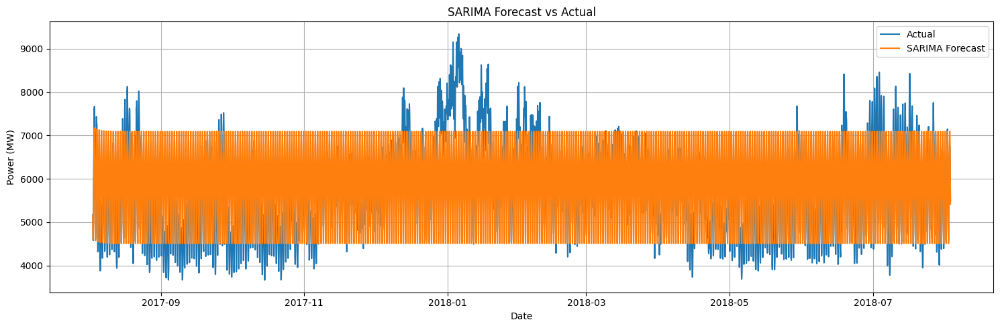

In [ ]:
#Plotting Sarima predictions and actual
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test[target_col], label='Actual')
plt.plot(sarima_forecast.index, sarima_forecast, label='SARIMA Forecast')
plt.legend()
plt.title("SARIMA Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# ___ Prophet Model ___
from prophet import Prophet

prophet_forecast = pd.Series([np.nan] * len(y_test), index=y_test.index)
df_prophet = y.reset_index().rename(columns={'date&time': 'ds', target_col: 'y'})

# Ensure the training data is not empty
train_data = df_prophet.iloc[:-test_days]
print(f"Shape of Prophet training data: {train_data.shape}")

try:
    if not train_data.empty:
        prophet = Prophet()
        prophet.fit(train_data)
        future = df_prophet.iloc[-test_days:][['ds']]
        prophet_forecast = prophet.predict(future).set_index('ds')['yhat']
    else:
        print("Prophet failed: Training data is empty.")
except Exception as e:
    print(f"Prophet failed: {e}")

Shape of Prophet training data: (26305, 2)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpb4q2ubeo/op0zqywt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpb4q2ubeo/3l1kzuky.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54857', 'data', 'file=/tmp/tmpb4q2ubeo/op0zqywt.json', 'init=/tmp/tmpb4q2ubeo/3l1kzuky.json', 'output', 'file=/tmp/tmpb4q2ubeo/prophet_model8mn_ydud/prophet_model-20250712084243.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:42:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:43:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# ___ Evaluation of Prophet Model ___
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Aligning and cleaning data
y_true = y_test[target_col]
y_pred = prophet_forecast.loc[y_true.index]

# Dropping any missing values (if any)
mask = (~y_true.isna()) & (~y_pred.isna())
y_true = y_true[mask]
y_pred = y_pred[mask]

# Compute evaluation metrics
mae = mean_absolute_error(y_true, y_pred)
rmse = mean_squared_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

# Print results
print("📊 Prophet Evaluation Metrics:")
print(f"MAE  (Mean Absolute Error): {mae:.2f} MW")
print(f"RMSE (Root Mean Squared Error): {rmse:.2f} MW")
print(f"R²   (R-squared): {r2:.4f}")

📊 Prophet Evaluation Metrics:
MAE  (Mean Absolute Error): 922.31 MW
RMSE (Root Mean Squared Error): 1332008.15 MW
R²   (R-squared): -0.3492


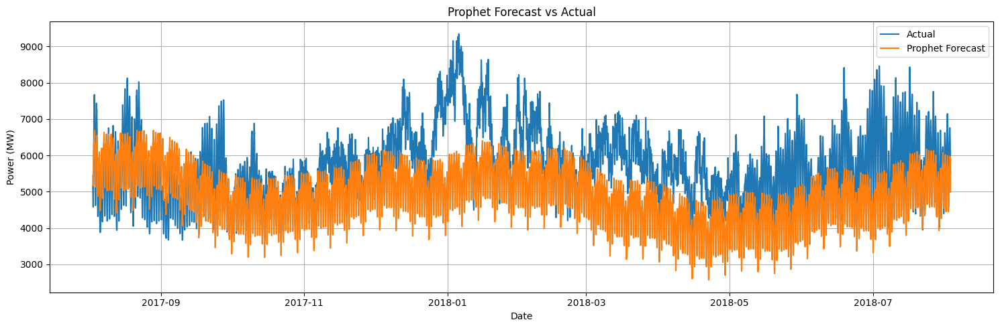

In [ ]:
# Plotting prophet predictions vs Actual values
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test[target_col], label='Actual')
plt.plot(prophet_forecast.index, prophet_forecast, label='Prophet Forecast')
plt.legend()
plt.title("Prophet Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# ___ NeuralProphet Model___
from neuralprophet import NeuralProphet

# Constants
test_hours = 365 * 24  # 8760
target_col = 'PJMW_MW'

# Prepare df_prophet
df_prophet_clean = df[[target_col]].reset_index().rename(columns={'date&time': 'ds', target_col: 'y'})
df_prophet_clean['ds'] = pd.to_datetime(df_prophet_clean['ds'])
df_prophet_clean = df_prophet_clean.sort_values('ds')

# Check frequency and reindex to ensure no missing hours
full_range = pd.date_range(start=df_prophet_clean['ds'].min(),
                           end=df_prophet_clean['ds'].max(),
                           freq='H')
df_prophet_clean = df_prophet_clean.set_index('ds').reindex(full_range).rename_axis('ds').reset_index()
# Fill missing values
df_prophet_clean['y'] = df_prophet_clean['y'].interpolate(method='linear')

# Splitting train/test
train_df = df_prophet_clean.iloc[:-test_hours]

# Fitting model
np_model = NeuralProphet(
    daily_seasonality=True,
    weekly_seasonality=True,
    yearly_seasonality=True
)
np_model.fit(train_df, freq='H')

# Make clean future dataframe
future = np_model.make_future_dataframe(
    df=train_df,     # use only the training set
    periods=test_hours,
    n_historic_predictions=False
)

# Predict
forecast = np_model.predict(future)

# Extract and align the forecast
np_forecast = forecast.set_index('ds')['yhat1']
np_forecast = np_forecast.reindex(y_test.index)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.996% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.996% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 128
INFO:NP.config:Auto-set batch_size to 128
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 40
INFO:NP.config:Auto-set epochs to 40


Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (206) is too small than the required number                     for the learning rate finder (260). The results might not be optimal.


Finding best initial lr:   0%|          | 0/260 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.996% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.996% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.989% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.989% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO:NP.df_utils:Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.989% of the data.
INFO:NP.df_utils:Major frequency h corresponds to 99.989% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [ ]:
# ___ Evaluation of Neuralprophet ___
y_test_series = df_prophet_clean.set_index('ds')['y'].iloc[-test_hours:]
y_true = y_test_series.loc[np_forecast.index]
y_pred = np_forecast

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
mae = mean_absolute_error(y_true, y_pred)
rmse = mean_squared_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print("\n📊 NeuralProphet Evaluation Metrics:")
print(f"MAE  (Mean Absolute Error): {mae:.2f} MW")
print(f"RMSE (Root Mean Squared Error): {rmse:.2f} MW")
print(f"R²   (R-squared): {r2:.4f}")


📊 NeuralProphet Evaluation Metrics:
MAE  (Mean Absolute Error): 585.46 MW
RMSE (Root Mean Squared Error): 538251.50 MW
R²   (R-squared): 0.4548


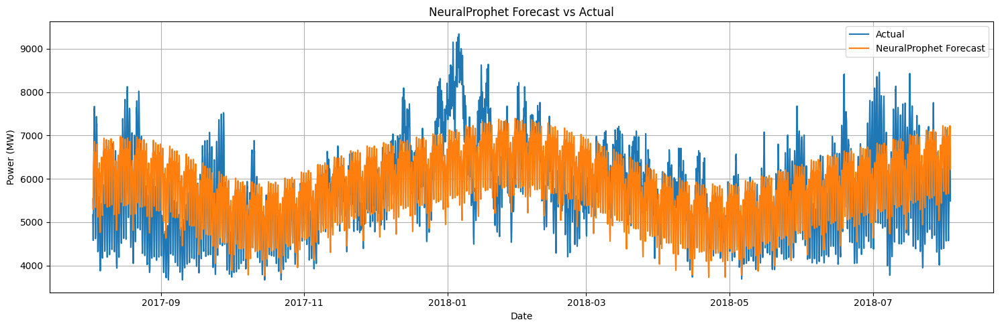

In [ ]:
# Plotting Neuralprophet forecast predictions vs Actual
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test[target_col], label='Actual')
plt.plot(np_forecast.index, np_forecast, label='NeuralProphet Forecast')
plt.legend()
plt.title("NeuralProphet Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.grid(True)
plt.tight_layout()
plt.show()

Epoch 1/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 61s 73ms/step - loss: 414263508992.0000
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 60s 73ms/step - loss: 0.0124
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 82s 73ms/step - loss: 0.0113
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 82s 73ms/step - loss: 0.0065
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.0026
274/274 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step

📊 LSTM Evaluation Metrics:
MAE  (Mean Absolute Error): 232.70 MW
RMSE (Root Mean Squared Error): 295.42 MW
R²   (R-squared): 0.9116


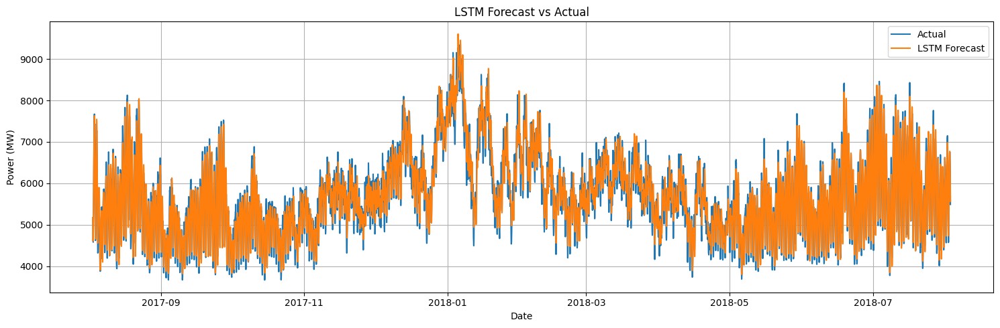

In [ ]:
# ___ LSTM Model ___
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense

# ___ Parameters ___
TARGET_COL = 'PJMW_MW'
SEQ_LEN = 168               # Past 168 hours (1 week)
TEST_HOURS = 365 * 24       # 1 year
EPOCHS = 5
BATCH_SIZE = 32

# ___ Scaling the target column ___
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df[[TARGET_COL]])

# ___ Creating sequences ___
def create_sequences(series, seq_len):
    X, y = [], []
    for i in range(len(series) - seq_len):
        X.append(series[i:i+seq_len])
        y.append(series[i+seq_len])
    return np.array(X), np.array(y)

X_all, y_all = create_sequences(data_scaled, SEQ_LEN)

# ___ Time-based train/test split ___
split_index = len(X_all) - TEST_HOURS
X_train, X_test = X_all[:split_index], X_all[split_index:]
y_train, y_test = y_all[:split_index], y_all[split_index:]

# Reshape for LSTM
X_train = X_train.reshape((-1, SEQ_LEN, 1))
X_test = X_test.reshape((-1, SEQ_LEN, 1))

# ___ LSTM Model ___
model = Sequential([
    LSTM(64, activation='relu', input_shape=(SEQ_LEN, 1)),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=1)

# ___ Forecast and Inverse Scale ___
preds = model.predict(X_test)
y_pred = scaler.inverse_transform(preds).flatten()
y_true = scaler.inverse_transform(y_test).flatten()

# ___ Evaluation ___
# Aligning y_true and y_pred with the correct index from the original dataframe
start_idx = len(df) - len(y_pred)
evaluation_index = df.index[start_idx:]

y_true_aligned = pd.Series(y_true, index=evaluation_index)
y_pred_aligned = pd.Series(y_pred, index=evaluation_index)

# Droping any remaining NaNs from the aligned series before evaluation
y_true_aligned.dropna(inplace=True)
y_pred_aligned.dropna(inplace=True)

# Ensuring y_true and y_pred have the same index after dropping NaNs
common_index = y_true_aligned.index.intersection(y_pred_aligned.index)
y_true_final = y_true_aligned.loc[common_index]
y_pred_final = y_pred_aligned.loc[common_index]


mae = mean_absolute_error(y_true_final, y_pred_final)
rmse = np.sqrt(mean_squared_error(y_true_final, y_pred_final))
r2 = r2_score(y_true_final, y_pred_final)

print("\n📊 LSTM Evaluation Metrics:")
print(f"MAE  (Mean Absolute Error): {mae:.2f} MW")
print(f"RMSE (Root Mean Squared Error): {rmse:.2f} MW")
print(f"R²   (R-squared): {r2:.4f}")

# ___ Plot ___
plt.figure(figsize=(15,5))
plt.plot(evaluation_index, y_true_aligned, label='Actual')
plt.plot(evaluation_index, y_pred_aligned, label='LSTM Forecast')
plt.title("LSTM Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Preparing for XGBM & LGBM models
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
import lightgbm as lgb

# ___ Configuration ___
TARGET_COL = 'PJMW_MW'
LAG = 168                   # Past 168 hours (1 week)
TEST_HOURS = 365 * 24       # Last 1 year

# ___ Creating lag features ___
def create_lag_features(df, target_col, lag):
    df_lag = df.copy()
    for i in range(1, lag + 1):
        df_lag[f'lag_{i}'] = df_lag[target_col].shift(i)
    df_lag.dropna(inplace=True)
    return df_lag

df_lagged = create_lag_features(df, TARGET_COL, LAG)

# ___ Time-based train/test split ___
train_df = df_lagged.iloc[:-TEST_HOURS]
test_df = df_lagged.iloc[-TEST_HOURS:]

X_train = train_df.drop(columns=[TARGET_COL])
y_train = train_df[TARGET_COL]
X_test = test_df.drop(columns=[TARGET_COL])
y_test = test_df[TARGET_COL]

# ___ Scaling the features ___
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# ___ XGBoost Model ___
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
xgb_model.fit(X_train_scaled, y_train)

xgb_preds = xgb_model.predict(X_test_scaled)

# ___ Evaluation ___
xgb_mae = mean_absolute_error(y_test, xgb_preds)
xgb_rmse = mean_squared_error(y_test, xgb_preds)
xgb_r2 = r2_score(y_test, xgb_preds)

print("\n📊 XGBoost Evaluation:")
print(f"MAE  : {xgb_mae:.2f} MW")
print(f"RMSE : {xgb_rmse:.2f} MW")
print(f"R²   : {xgb_r2:.4f}")


📊 XGBoost Evaluation:
MAE  : 67.19 MW
RMSE : 7828.96 MW
R²   : 0.9921


In [ ]:
# ___ LightGBM Model ___
lgb_model = lgb.LGBMRegressor(objective='regression', n_estimators=100)
lgb_model.fit(X_train_scaled, y_train)

lgb_preds = lgb_model.predict(X_test_scaled)

# ___ Evaluation ___
lgb_mae = mean_absolute_error(y_test, lgb_preds)
lgb_rmse = mean_squared_error(y_test, lgb_preds)
lgb_r2 = r2_score(y_test, lgb_preds)

print("\n📊 LightGBM Evaluation:")
print(f"MAE  : {lgb_mae:.2f} MW")
print(f"RMSE : {lgb_rmse:.2f} MW")
print(f"R²   : {lgb_r2:.4f}")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42840
[LightGBM] [Info] Number of data points in the train set: 26137, number of used features: 168
[LightGBM] [Info] Start training from score 5561.697517

📊 LightGBM Evaluation:
MAE  : 65.21 MW
RMSE : 7250.91 MW
R²   : 0.9927


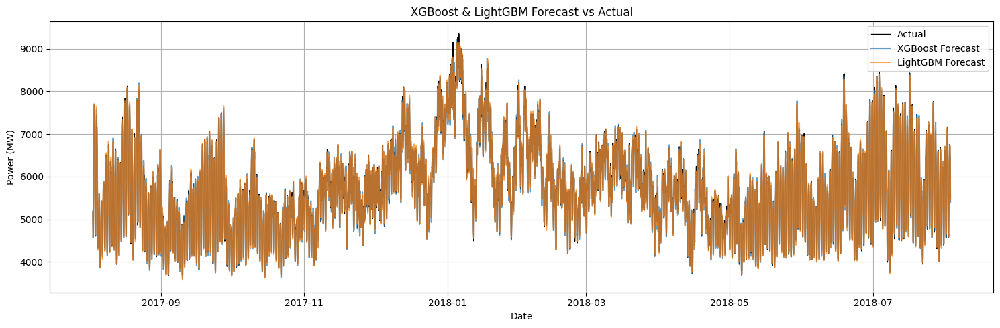

In [ ]:
# Plotting XGBoost & LightGBM Forecast vs Actual
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test.values, label='Actual', color='black', linewidth=1)
plt.plot(y_test.index, xgb_preds, label='XGBoost Forecast', alpha=0.7)
plt.plot(y_test.index, lgb_preds, label='LightGBM Forecast', alpha=0.7)
plt.title("XGBoost & LightGBM Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# ___ DART Model ___
# ___ Config ___
TARGET_COL = 'PJMW_MW'
LAG = 168
TEST_HOURS = 365 * 24  # Last year

# ___ Create lag features ___
def create_lag_features(df, col, lag):
    df_lagged = df.copy()
    for i in range(1, lag + 1):
        df_lagged[f'lag_{i}'] = df_lagged[col].shift(i)
    df_lagged.dropna(inplace=True)
    return df_lagged

df_lagged = create_lag_features(df, TARGET_COL, LAG)

# ___ Time-based split ___
train_df = df_lagged.iloc[:-TEST_HOURS]
test_df = df_lagged.iloc[-TEST_HOURS:]

X_train = train_df.drop(columns=[TARGET_COL])
y_train = train_df[TARGET_COL]
X_test = test_df.drop(columns=[TARGET_COL])
y_test = test_df[TARGET_COL]

# ___ Building DART Model ___
dart_model = lgb.LGBMRegressor(
    boosting_type='dart',
    n_estimators=200,
    learning_rate=0.05,
    objective='regression',
    random_state=42
)
dart_model.fit(X_train, y_train)

# ___ Predict & Evaluate ___
dart_preds = dart_model.predict(X_test)

mae = mean_absolute_error(y_test, dart_preds)
rmse = mean_squared_error(y_test, dart_preds)
r2 = r2_score(y_test, dart_preds)

print("\n📊 DART (LightGBM) Evaluation Metrics:")
print(f"MAE  : {mae:.2f} MW")
print(f"RMSE : {rmse:.2f} MW")
print(f"R²   : {r2:.4f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42840
[LightGBM] [Info] Number of data points in the train set: 26137, number of used features: 168
[LightGBM] [Info] Start training from score 5561.697517

📊 DART (LightGBM) Evaluation Metrics:
MAE  : 1002.62 MW
RMSE : 1048880.37 MW
R²   : -0.0624


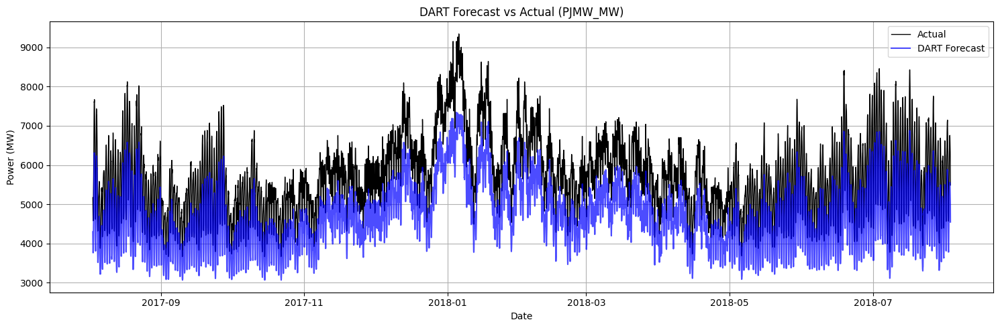

In [ ]:
# Plotting DART Forecast vs Actual (PJMW_MW)
plt.figure(figsize=(15,5))
plt.plot(y_test.index, y_test.values, label='Actual', color='black', linewidth=1)
plt.plot(y_test.index, dart_preds, label='DART Forecast', color='blue', alpha=0.7)
plt.title("DART Forecast vs Actual (PJMW_MW)")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# ___ TCN Model ___
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import Dense
from tcn import TCN
import matplotlib.pyplot as plt

# ___ Parameters ___
TARGET_COL = 'PJMW_MW'
SEQ_LEN = 168              # Past 1 week
TEST_HOURS = 365 * 24      # Last 1 year
EPOCHS = 5
BATCH_SIZE = 32

# ___ Scale the data ___
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[[TARGET_COL]])

# ___ Step 2: Create sequences ___
def create_sequences(data, seq_len):
    X, y = [], []
    for i in range(len(data) - seq_len):
        X.append(data[i:i+seq_len])
        y.append(data[i+seq_len])
    return np.array(X), np.array(y)

X_all, y_all = create_sequences(scaled_data, SEQ_LEN)

# ___ Train/test split ___
split_idx = len(X_all) - TEST_HOURS
X_train, X_test = X_all[:split_idx], X_all[split_idx:]
y_train, y_test = y_all[:split_idx], y_all[split_idx:]

# Reshape for TCN: (samples, timesteps, features)
X_train = X_train.reshape((-1, SEQ_LEN, 1))
X_test = X_test.reshape((-1, SEQ_LEN, 1))

# ___ Building TCN model ___
model = Sequential([
    TCN(input_shape=(SEQ_LEN, 1), nb_filters=64, kernel_size=3, dilations=[1, 2, 4, 8], return_sequences=False),
    Dense(1)
])
model.compile(optimizer='adam', loss='mse')

# ___ Train ___
model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=1)

# ___ Predict and inverse transform ___
preds = model.predict(X_test)
y_pred = scaler.inverse_transform(preds).flatten()
y_true = scaler.inverse_transform(y_test).flatten()

# ___ Evaluation of TCN Model___
mae = mean_absolute_error(y_true, y_pred)
rmse = mean_squared_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print("\n📊 TCN Evaluation Metrics:")
print(f"MAE  : {mae:.2f} MW")
print(f"RMSE : {rmse:.2f} MW")
print(f"R²   : {r2:.4f}")


Epoch 1/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 92s 108ms/step - loss: 0.2888
Epoch 2/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 142s 107ms/step - loss: 5.8155e-04
Epoch 3/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 142s 107ms/step - loss: 4.6827e-04
Epoch 4/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 139s 104ms/step - loss: 4.6194e-04
Epoch 5/5
817/817 ━━━━━━━━━━━━━━━━━━━━ 141s 102ms/step - loss: 4.8011e-04
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

📊 TCN Evaluation Metrics:
MAE  : 84.42 MW
RMSE : 11665.53 MW
R²   : 0.9882


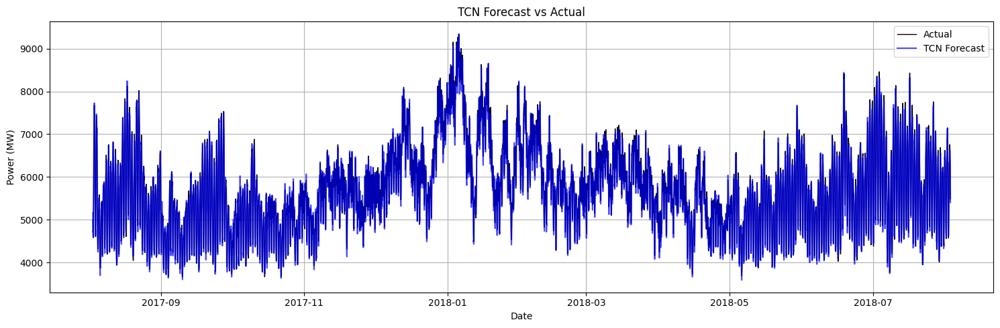

In [ ]:
# Plotting TCN model predictions vs Actual values
plt.figure(figsize=(15,5))
plt.plot(evaluation_index, y_true, label='Actual', color='black', linewidth=1) # Use evaluation_index for plotting
plt.plot(evaluation_index, y_pred, label='TCN Forecast', color='blue', alpha=0.7) # Use evaluation_index for plotting
plt.title("TCN Forecast vs Actual")
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# ForeCasting of next 30 Days hourly data of power consumption
# ___ Parameters ___
TARGET_COL = 'PJMW_MW'
INPUT_HOURS = 168      # Past 1 week
OUTPUT_HOURS = 720      # Predict 30 days

# ___ Prepare supervised data ___
scaler = StandardScaler()
scaled_series = scaler.fit_transform(df[[TARGET_COL]]).flatten()

# Create input-output pairs
X, y = [], []
for i in range(len(scaled_series) - INPUT_HOURS - OUTPUT_HOURS):
    X.append(scaled_series[i:i+INPUT_HOURS])
    y.append(scaled_series[i+INPUT_HOURS:i+INPUT_HOURS+OUTPUT_HOURS])
X = np.array(X).reshape(-1, INPUT_HOURS, 1)  # (samples, time_steps, features)
y = np.array(y).reshape(-1, OUTPUT_HOURS, 1)

In [ ]:
# ___ Build TCN model ___
model = Sequential([
    TCN(input_shape=(INPUT_HOURS, 1), nb_filters=64, dilations=[1, 2, 4, 8], return_sequences=False),
    Dense(OUTPUT_HOURS),
])
model.compile(optimizer='adam', loss='mse')
model.fit(X, y.reshape(-1, OUTPUT_HOURS), epochs=5, batch_size=32, verbose=1)

# ___ Predict using last window ___
last_input = scaled_series[-INPUT_HOURS:].reshape(1, INPUT_HOURS, 1)
pred_scaled = model.predict(last_input)[0]  # shape: (720,)
pred = scaler.inverse_transform(pred_scaled.reshape(-1, 1)).flatten()

# ___ Build forecast datetime index ___
last_timestamp = df.index[-1]
future_index = pd.date_range(start=last_timestamp + pd.Timedelta(hours=1), periods=OUTPUT_HOURS, freq='H')
forecast_series = pd.Series(pred, index=future_index, name='Forecast_PJMW_MW')


Epoch 1/5
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 124s 110ms/step - loss: 0.7639
Epoch 2/5
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 116s 109ms/step - loss: 0.4750
Epoch 3/5
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 143s 110ms/step - loss: 0.4305
Epoch 4/5
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 138s 107ms/step - loss: 0.4049
Epoch 5/5
1069/1069 ━━━━━━━━━━━━━━━━━━━━ 142s 107ms/step - loss: 0.3898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


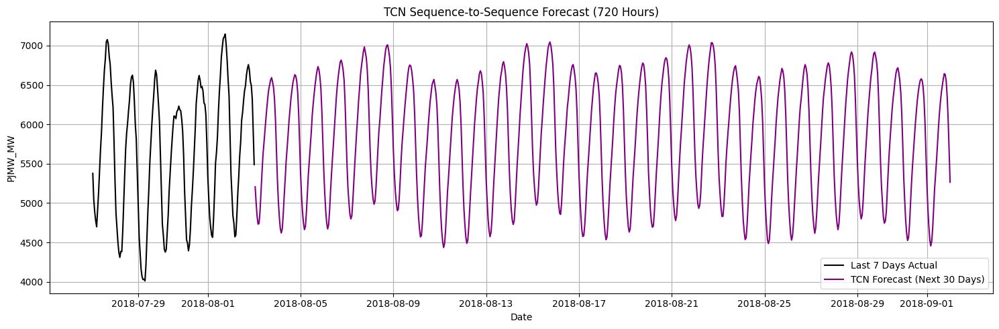

In [ ]:
# ___ Plot forecast  ___
plt.figure(figsize=(15, 5))
plt.plot(df[TARGET_COL].iloc[-7*24:], label="Last 7 Days Actual", color='black')
plt.plot(forecast_series, label="TCN Forecast (Next 30 Days)", color='purple')
plt.xlabel("Date")
plt.ylabel("PJMW_MW")
plt.title("TCN Sequence-to-Sequence Forecast (720 Hours)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()